# Brief Overview of the Environment and Method

## Car Racing with Cross-Entropy Method (CEM) using Gymnasium

This project demonstrates the application of the Cross-Entropy Method (CEM), a reinforcement learning algorithm, to solve the car racing task provided by the `gymnasium` package. The car racing environment is a challenging task that involves controlling a car to navigate through a track as quickly as possible.

## Environment

The car racing environment, known as `CarRacing-v2`, is a part of the `gymnasium` package. It presents a simple car racing simulator, where the objective is to control a car to complete laps on a procedurally generated track. The agent must learn to control the throttle, brake, and steering to navigate the track efficiently.

### Action Space

If continuous there are 3 actions :

0. steering, -1 is full left, +1 is full right

1. gas

2. breaking

If discrete there are 5 actions:

0. do nothing

1. steer left

2. steer right

3. gas

4. brake

### Observation Space

A top-down 96x96 RGB image of the car and race track.

### Rewards

The reward is -0.1 every frame and +1000/N for every track tile visited, where N is the total number of tiles visited in the track. For example, if you have finished in 732 frames, your reward is 1000 - 0.1*732 = 926.8 points.

### Starting State

The car starts at rest in the center of the road.

### Episode Termination

The episode finishes when all the tiles are visited. The car can also go outside the playfield - that is, far off the track, in which case it will receive -100 reward and die.

For more details on the `gymnasium` package and the car racing environment, please refer to the official documentation: [Gymnasium Documentation](https://www.gymlibrary.dev/).


## Cross-Entropy Method (CEM)

The Cross-Entropy Method (CEM) is a probabilistic technique used for optimization and solving reinforcement learning problems. It iteratively samples solutions, evaluates them, and selects the best solutions to update the distribution of the next solution samples.

### Mathematical Overview

The goal of CEM is to optimize a policy $\pi_\theta$ parameterized by $\theta$, to maximize expected rewards $R$. The method involves two main steps: sampling and updating.

1. **Sampling**: In each iteration, sample $N$ policies $\theta_i$ from a distribution $p_\theta(*)$, and evaluate their performance in the environment.

2. **Updating**: Select the top $M$ performers $M < N$, and use their parameters to update the distribution $p_\theta(*)$ for the next iteration.

The parameter distribution is often chosen to be a Gaussian $\mathcal{N}(\mu, \Sigma)$, where $\mu$ and $\Sigma$ are updated at each iteration based on the selected top performers.

#### Distribution Update Formulas

Given the top $M$ performing parameter sets, the update formulas for $\mu$ and $\Sigma$ are:

- New mean $\mu_{new} = \frac{1}{M} \sum_{i=1}^{M} \theta_i$

- New covariance $\Sigma_{new} = \frac{1}{M} \sum_{i=1}^{M} (\theta_i - \mu_{new})(\theta_i - \mu_{new})^T$

Where $\theta_i$ are the parameters of the top $M$ policies.

### Application to Car Racing

In the context of the car racing environment, the policy $\pi_\theta$ controls the actions of the car (brake, steering) based on the current state of the environment. The CEM iteratively improves this policy by selecting the parameters that lead to the highest rewards, effectively learning to navigate the car through the track efficiently.


# Package installation

In [4]:
!pip install gymnasium
!pip install pyproject-toml
!pip install swig
!pip install gymnasium[box2d]
!pip install pyvirtualdisplay
!pip install cma


!apt install xvfb

  Using cached box2d-py-2.3.5.tar.gz (374 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for box2d-py: filename=box2d_py-2.3.5-cp310-cp310-linux_x86_64.whl size=2376102 sha256=93b6b9ddbd1e0fff619b62ee5f7134c60c994a0b98e136a2edb3dd2c93a1806f
  Stored in directory: /root/.cache/pip/wheels/db/8f/6a/eaaadf056fba10a98d986f6dce954e6201ba3126926fc5ad9e
Successfully built box2d-py
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.8).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


# Package importation

In [5]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt
import sys

import imageio     # To render episodes in GIF images (otherwise there would be no render on Google Colab)
                   # C.f. https://stable-baselines.readthedocs.io/en/master/guide/examples.html#bonus-make-a-gif-of-a-trained-agent
import IPython
from IPython.display import Image
import pyvirtualdisplay
import time
from tqdm import tqdm
import itertools
import math
import torch

# Environment

In [6]:
env = gym.make('CarRacing-v2', continuous=False, render_mode="rgb_array")
print("Observation space: ", env.observation_space)
print("Action space: ", env.action_space)
state, info = env.reset()
print("Current state: ", state.shape, type(state))
env.close()

Observation space:  Box(0, 255, (96, 96, 3), uint8)
Action space:  Discrete(5)
Current state:  (96, 96, 3) <class 'numpy.ndarray'>


In [7]:
# To display GIF images in the notebook

def is_colab():
    return "google.colab" in sys.modules

if is_colab():


    _display = pyvirtualdisplay.Display(visible=False,  # use False with Xvfb
                                        size=(1400, 900))
    _ = _display.start()

class RenderWrapper:
    def __init__(self, env, force_gif=False):
        self.env = env
        self.force_gif = force_gif
        self.reset()

    def reset(self):
        self.images = []

    def render(self):
        if not is_colab():
            self.env.render()
            time.sleep(1./60.)

        if is_colab() or self.force_gif:
            img = self.env.render()         # Assumes env.render_mode == 'rgb_array'
            self.images.append(img)

    def make_gif(self, filename="render"):
        if is_colab() or self.force_gif:
            imageio.mimsave(filename + '.gif', [np.array(img) for i, img in enumerate(self.images) if i%2 == 0], fps=29, loop=0)
            return Image(open(filename + '.gif','rb').read())

    @classmethod
    def register(cls, env, force_gif=False):
        env.render_wrapper = cls(env, force_gif=True)

### Testing Render with random policy


In [ ]:
RenderWrapper.register(env, force_gif=True)

observation, info = env.reset()

for t in range(1000):
    env.render_wrapper.render()
    # Random policy
    action = env.action_space.sample()

    observation, reward, done, truncated, info = env.step(action)

env.close()

env.render_wrapper.make_gif("Testing random policy car racing")

# CEM & Policy, Objective function

## Objective function

In [17]:
class ObjectiveFunction:

    def __init__(self, env, policy, num_episodes=1, max_time_steps=float('inf'), minimization_solver=True):
        self.ndim = policy.num_params
        self.env = env
        self.policy = policy
        self.num_episodes = num_episodes
        self.max_time_steps = max_time_steps
        self.minimization_solver = minimization_solver

        self.num_evals = 0


    def eval(self, num_episodes=None, max_time_steps=None, render=False, pbar=None, sample_index=None,  reward_threshold=-50):
        """Evaluate a policy"""

        self.num_evals += 1

        if num_episodes is None:
            num_episodes = self.num_episodes

        if max_time_steps is None:
            max_time_steps = self.max_time_steps

        average_total_rewards = 0

        for i_episode in range(self.num_episodes):

            total_rewards = 0.
            state, info = self.env.reset()
            # pbar = tqdm(range(max_time_steps), desc='Evaluating policy')
            for t in range(max_time_steps):
                if render:
                    self.env.render_wrapper.render()
                # print("yes")

                action = self.policy(state)
                state, reward, done, truncated, info = self.env.step(action)
                if done or truncated:
                    break
                total_rewards += reward

                if total_rewards < reward_threshold:
                    break

                if pbar is not None:
                    pbar.set_postfix({
                        'total current reward': total_rewards,
                        'current evaluating time step': t,
                        'current evaluating episode': f"{i_episode}/{num_episodes}",
                        'current sample': sample_index
                    })


            average_total_rewards += float(total_rewards)


            if render:
                print("Test Episode {0}: Total Reward = {1}".format(i_episode, total_rewards))

        average_total_rewards /= self.num_episodes

        if self.minimization_solver:
            average_total_rewards *= -1.

        return average_total_rewards   # Optimizers do minimization by default...


    def __call__(self, num_episodes=None,
                 max_time_steps=None,
                 render=False,
                 pbar=None,
                 sample_index=None):
        return self.eval(num_episodes, max_time_steps, render, pbar, sample_index)

## Policy for the continuous action space

In [10]:
class CNNPolicy(torch.nn.Module):
    def __init__(self, device=None, image_shape=(96, 96, 3), output_dim = 5):
        super(CNNPolicy, self).__init__()
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=4, kernel_size=3, padding=1)
        self.conv2 = torch.nn.Conv2d(in_channels=4, out_channels=8, kernel_size=3, padding=1)
        self.conv3 = torch.nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, padding=1)
        self.pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = torch.nn.Flatten()
        self.fc1 = torch.nn.Linear(16 * 12 * 12, 16, bias=True)
        self.fc2 = torch.nn.Linear(16, output_dim, bias=True)
        self.eval=True
        self.num_params = sum(p.numel() for p in self.parameters() if p.requires_grad)
        if device is not None:
            self.to(device)
            self.device = device
        else:
            self.device = 'cpu'

    @torch.no_grad()
    def forward(self, current_state):
        current_state = torch.Tensor(current_state).float().view(3, 96, 96).to(self.device)[None, ...]
        current_state = self.pool(torch.nn.functional.relu(self.conv1(current_state)))
        current_state = self.pool(torch.nn.functional.relu(self.conv2(current_state)))
        current_state = self.pool(torch.nn.functional.relu(self.conv3(current_state)))
        current_state = self.flatten(current_state)
        current_state = torch.nn.functional.relu(self.fc1(current_state))
        current_state = self.fc2(current_state)
        return current_state[0].argmax().item()

    def change_weights(self, weights):
        #TODO: overwrite it normally cause if we'd like to change thr architecture of the CNNPolicy it's gonna be impossible -> not flexible at all
        shape_1 = self.conv1.weight.data.shape
        shape_12 = self.conv1.weight.data.shape[0]
        shape_2 = self.conv2.weight.data.shape
        shape_22 = self.conv2.weight.data.shape[0]
        shape_3 = self.conv3.weight.data.shape
        shape_32 = self.conv3.weight.data.shape[0]
        shape_4 = self.fc1.weight.data.shape
        shape_42 = self.fc1.weight.data.shape[0]
        shape_5 = self.fc2.weight.data.shape
        shape_52 = self.fc2.weight.data.shape[0]

        curr_index = 0
        self.conv1.weight.data = torch.Tensor(weights[:math.prod(shape_1)]).view(*tuple(shape_1)).to(self.device)
        curr_index += math.prod(shape_1)
        self.conv1.bias.data = torch.Tensor(weights[curr_index: curr_index + shape_12]).to(self.device)
        curr_index+=shape_12

        self.conv2.weight.data = torch.Tensor(weights[curr_index: curr_index + math.prod(shape_2)]).view(*tuple(shape_2)).to(self.device)
        curr_index += math.prod(shape_2)
        self.conv2.bias.data = torch.Tensor(weights[curr_index : curr_index + shape_22]).to(self.device)
        curr_index += shape_22

        self.conv3.weight.data = torch.Tensor(weights[curr_index: curr_index + math.prod(shape_3)]).view(*tuple(shape_3)).to(self.device)
        curr_index += math.prod(shape_3)
        self.conv3.bias.data = torch.Tensor(weights[curr_index : curr_index + shape_32]).to(self.device)
        curr_index += shape_32

        self.fc1.weight.data = torch.Tensor(weights[curr_index: curr_index + math.prod(shape_4)]).view(*tuple(shape_4)).to(self.device)
        curr_index += math.prod(shape_4)
        self.fc1.bias.data = torch.Tensor(weights[curr_index : curr_index + shape_42]).to(self.device)
        curr_index += shape_42

        self.fc2.weight.data = torch.Tensor(weights[curr_index: curr_index + math.prod(shape_5)]).view(*tuple(shape_5)).to(self.device)
        curr_index += math.prod(shape_4)
        # self.fc2.bias.data = torch.Tensor(weights[curr_index : ]).to(self.device)
        # curr_index += shape_52

## CEM

### CEM-uncorrelated

In [11]:
def cem_uncorrelated(objective_function,
                     policy,
                     mean_array,
                     var_array,
                     max_iterations=500,
                     sample_size=50,
                     elite_frac=0.2,
                     print_every=10,
                     success_score=float("inf"),
                     num_evals_for_stop=None,
                     hist_dict=None):
    """Cross-entropy method.

    Params
    ======
        objective_function (function): the function to maximize
        mean_array (array of floats): the initial proposal distribution (mean vector)
        var_array (array of floats): the initial proposal distribution (variance vector)
        max_iterations (int): number of training iterations
        sample_size (int): size of population at each iteration
        elite_frac (float): rate of top performers to use in update with elite_frac ∈ ]0;1]
        print_every (int): how often to print average score
        hist_dict (dict): logs
    """
    assert 0. < elite_frac <= 1.

    n_elite = math.ceil(sample_size * elite_frac)
    if len(hist_dict.keys()) == 0:
        hist_dict['reward'] = []

    n_params = len(mean_array)
    pbar = tqdm(range(max_iterations), desc='Fitting theta')
    for i in pbar:
        samples = np.random.normal(mean_array, np.sqrt(var_array), (sample_size, n_params))
        scores = []
        for sample_index in range(len(samples)):
            nn_policy.change_weights(samples[sample_index])
            scores += [objective_function(pbar=pbar, sample_index=sample_index)]
        scores = np.array(scores)
        # print(scores[scores.argsort()])
        elite_idx = scores.argsort()[:n_elite]
        elite_samples = samples[elite_idx]

        mean_array = elite_samples.mean(0)
        # print(mean_array)
        var_array = elite_samples.var(0)


        pbar.set_postfix({
            'current best score': -scores[elite_idx[0]]
        })

        hist_dict['reward']+=[np.mean(-scores)]

        if (i % print_every == 0 or i == max_iterations - 1) and i != 0:
            print(f"""
            =======================
            Iteration {i+1},
            mean score = {-scores.mean()},
            current best score = {-scores[elite_idx[0]]}
            =======================""")

        if scores[elite_idx[0]] <= success_score:
            print(f"\nWe got succes score at {i+1} iteration, current best score = {-scores[elite_idx[0]]}, success_score = {-success_score}")
            break

        if num_evals_for_stop is not None and objective_function.num_evals >= num_evals_for_stop:
            print(f"\nStopping after {objective_function.num_evals} evaluations.")
            break

    return mean_array, var_array, hist_dict

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
nn_policy = CNNPolicy(device)
# print(nn_policy.num_params)
hist_dict = {}
objective_function = ObjectiveFunction(env=env,
                                       policy=nn_policy,
                                       num_episodes=2,
                                       max_time_steps=1000)

init_mean_array = np.random.random(nn_policy.num_params)
init_var_array = np.ones(nn_policy.num_params) * 100.


theta, var, hist_dict = cem_uncorrelated(objective_function=objective_function,
                         policy=nn_policy,
                         mean_array=init_mean_array,
                         var_array=init_var_array,
                         max_iterations=10,
                         sample_size=20,
                         elite_frac=0.1,
                         print_every=10,
                         success_score=-600,
                         num_evals_for_stop=None,
                         hist_dict=hist_dict)

objective_function.env.close()

Fitting theta: 100%|██████████| 10/10 [48:02<00:00, 288.24s/it, current best score=140]


            Iteration 10,
            mean score = 56.012856383170956,
            current best score = 140.2555555555564


In [21]:
with open('test_var.npy', 'wb') as f:
    np.save(f, theta)

In [ ]:
with open('test.npy', 'rb') as f:
    a = np.load(f)

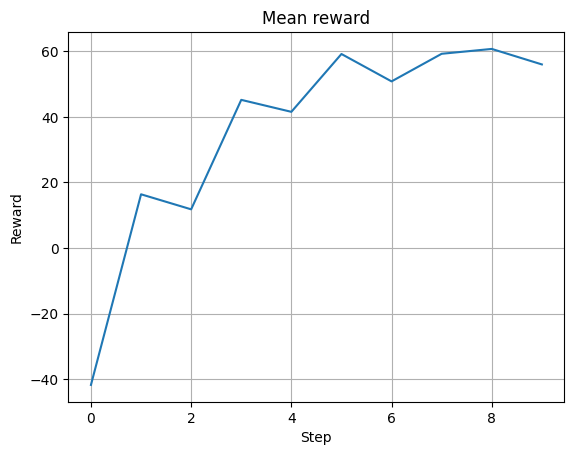

In [28]:
plt.plot(hist_dict['reward'])
plt.title("Mean reward")
plt.grid(True)
plt.ylabel("Reward")
plt.xlabel("Step")
plt.show()

Test Episode 0: Total Reward = 122.74864864864924
Test Episode 1: Total Reward = 35.40707070707031
Test Episode 2: Total Reward = 33.65245901639305
Test Episode 3: Total Reward = 40.686956521738765
Test Episode 4: Total Reward = 127.94615384615449
Test Episode 5: Total Reward = 33.35245901639304
Test Episode 6: Total Reward = 26.811801242235603
Test Episode 7: Total Reward = 40.8456273764255
Test Episode 8: Total Reward = 21.45722379603358
Test Episode 9: Total Reward = 32.007692307691876


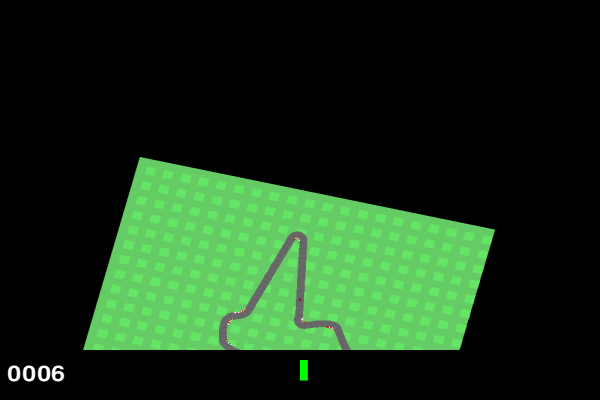

In [30]:
nn_policy.change_weights(theta)

RenderWrapper.register(env, force_gif=True)
objective_function = ObjectiveFunction(env=env,
                                       policy=nn_policy,
                                       num_episodes=10,
                                       max_time_steps=1000)
observation, info = env.reset()
objective_function.eval(observation, render=True)

objective_function.env.close()

objective_function.env.render_wrapper.make_gif("testing")

### CEM-uncorrelated